<a href="https://colab.research.google.com/github/Loading-my-brain/GEOG761_Remote_Sensing/blob/main/Labs/GEOG761_Lab1_Notes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction
The primary objective of this lab is to familiarise you with the basic mechanics that allow you to get hold of satellite data for the purposes of carrying out machine learning. The second objective is for you to put into practice some of the theory that we covered in lectures 1 and 2, in order that you can start to understand some of the specific quirks and potentially powerful attributes of satellite data when it comes to applying machine learning techniques.

This lab has drawn upon the following sources, tutorials and repos:


*   https://geemap.org/
*   https://developers.google.com/earth-engine

Whenever you see a numbered question, e.g. '(1)', make sure that you answer it in the answer proforma and submit the resulting document on Canvas. Only submit in .docx or .pdf formats (we cannot open 'pages' etc docs on Canvas).

If you want to submit code as your 'working' OR we ask you to give your code as part of the answer, give a link in your proforma document to a Colab notebook that is stored in a place we can access (your own GitHub account for example!).

Some of the questions will be relatively simple and are designed to get you thinking about the nature of the code and what it is doing, whilst also requiring you to pull in theoretical knowledge from the lectures. Other questions are exercises that ask you to both apply this knowledege to a new challenge and/or require you to independently go and seek answers.

In all cases I encourage you to give it a go, even if you do not have the full answer. Particularly for the larger challenges ('Exercises'), marks are awarded for workings and I want to see your thought process in action via the code you write.

Use text comments as demonstrated in these lab instructions to explain your thinking and communicate with the person marking your work.

I use both comments above chunks of code to tell you the overall objectives of that code, and inline comments to highlight specific features and elements to be aware of (formatted like this to draw your attention '#<-').

You are expected to present outputs to a professional standard. This means maps must have scales, north arrows and legends that are readable. For a good guide to all matters professional figure drawing, see this Nature guide:
*    https://research-figure-guide.nature.com/figures/preparing-figures-our-specifications/.

A portion of the marks are for presentation and communication.

# Set up

In [ ]:
# Set up GEE API
import ee
ee.Authenticate()
ee.Initialize(project='earthengine-ml-testing-502922')

In [ ]:
# Install the geemap package (only needs to be run once, uncomment below and run it the first time you run this notebook in a session).
# !pip install geemap

In [ ]:
import geemap

# Loading a map and displaying satellite data

In [ ]:
# Use the built in functions to load an ipyleaflet basemap (this is a UI to explore and see what we are doing)
# Note that I used to show you Open Street Map here, but there is currently a tile/scraper battle going on, and notebooks have been caught in the cross-fire.
Map = geemap.Map(center=(-41, 172), zoom=4, basemap="HYBRID")
Map

Map(center=[-41, 172], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright', tr…

In [ ]:
# Specify a different kind of basemap to display data layers over
Map = geemap.Map(center=(-41, 172), zoom=4) #<- note the lat-lon coordinate pair here
Map.add_basemap("USGS.USImageryTopo")
Map

Map(center=[-41, 172], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright', tr…

## Q1

Task(1) Find and add the basemap 'OpenTopoMap' to the display window AND change the code so that the map opens and zooms to the city of Auckland.
Provide a link to your code in a notebook and the output as a figure in the answer proforma. (2 pts)



---



## Hinami's Code to Answer

In [ ]:
# Task1
AKL_city_Map = geemap.Map(center=(-36.84777289548802, 174.76042775520804), #I got thee coordinates from Google Maps
                 zoom=10)
AKL_city_Map.add_basemap("OpenTopoMap")
AKL_city_Map

Map(center=[-36.84777289548802, 174.76042775520804], controls=(WidgetControl(options=['position', 'transparent…



---



In [ ]:
# Add Earth Engine datasets to our map by first creating variables to hold the calls to the EE api
Map = geemap.Map(center=(-41, 172), zoom=4)
dem = ee.Image("USGS/SRTMGL1_003")#The Shuttle Radar Topography Mission (SRTM) global digital elevation dataset at 30-meter resolution.
landcover = ee.Image("ESA/GLOBCOVER_L4_200901_200912_V2_3").select("landcover")#The European Space Agency’s global land cover map for 2009.
#Selects only the specific band named "landcover" from the multi-band raster image.

landsat7 = ee.Image("LANDSAT/LE7_TOA_5YEAR/1999_2003")#A composite of Landsat 7 Top-of-Atmosphere (TOA) imagery captured across a 5-year period (1999–2003).
states = ee.FeatureCollection("TIGER/2018/States")#A vector dataset containing United States state boundary polygons provided by the US Census Bureau.

In [ ]:
# Just to inspect them Indpvidually
#Map
#dem
#landcover
#landsat7
#states

In [ ]:
# Set visualization parameters.
vis_params = {
    "min": 0,
    "max": 4000, #<- if your satellite image is all white or all black, these vis params are the first thing to check and change
    "palette": ["006633", "E5FFCC", "662A00", "D8D8D8", "F5F5F5"], #<- these are HTML colour codes
}


# Some Notes:
# Raw satellite or elevation data values rarely correspond directly to visible
#screen pixels (0–255 grayscale or RGB). Visualization parameters map scientific data values to colors:
# - 0 represents sea level.
# - 4000 represents high mountain peaks (e.g., Aoraki / Mount Cook is ~3,724 m).
# - Values at or below 0 get the first color in the palette; values at or above 4000 get the last color. Anything in between gets linearly stretched.

In [ ]:
# Add a variety of different Earth Engine layers to the Map object
Map.addLayer(dem, vis_params, "SRTM DEM", True, 0.5) #<- note vis params called from the dictionary we set up before
Map.addLayer(landcover, {}, "Land cover")
Map.addLayer(
    landsat7, {"bands": ["B4", "B3", "B2"], "min": 20, "max": 200}, "Landsat 7" #<- note vis params in a dictionary here inside the add layer call
)
Map.addLayer(states, {}, "US States")




# dem: The raster image object to draw.
# vis_params: Applies the elevation color palette defined above.
# "SRTM DEM": The display title shown in the interactive map layer manager.
# True: Sets whether the layer is visible by default when loaded (True = checked).
# 0.5: Sets layer opacity to 50%, allowing underlying basemaps to show through.



## **Revision Hinami**

# SRTM DEM
 The Shuttle Radar Topography Mission Digital Elevation Model is a near-global relief map of Earth's land surface created from radar data captured by the Space Shuttle Endeavour in February 2000. It provides high-resolution elevation data used widely in mapping, science, and engineering

## Pros

* Global Consistency: Uniform data collection ensures standard quality worldwide.
* Easy Access: Free to download globally via platforms like EarthExplorer.
* Vegetation Penetration: C-band radar partially penetrates thick forest canopies.
* Fewer Voids: Newer processed versions have corrected missing data gaps.

## Cons

* Outdated Data: Captures Earth’s surface exactly as it was in February 2000.
* Canopy Topography: Measures forest tops, not true bare-earth ground elevation.
* Urban Distortion: Tall buildings scatter radar waves, causing height errors.
* Polar Gaps: Misses areas completely above 60°N and below 56°S.

## Primary Usages

* Terrain Visualization: Creating 3D maps and flight simulations.
* Disaster Management: Modeling flood zones, landslides, and volcanic hazards.
* Infrastructure Planning: Route planning for pipelines, roads, and cell towers.
* Environmental Studies: Tracking soil erosion and defining ecological zones.

[Documentation](https://lpdaac.usgs.gov/documents/179/SRTM_User_Guide_V3.pdf)


In [ ]:
# Dump all of this into the map view and take a look...
# Scroll around (look at both NZ and USA), check and uncheck the layers in the layer menu on the top-right.
Map

Map(center=[-41, 172], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright', tr…

(2) The Landsat 7 data displays as red colored/tinged image. Why is this? [Think about both the content in Lecture 1, and what is going on when you visualize a satellite image]. (2 pts)

---


The dataset "LANDSAT/LE7_TOA_5YEAR/1999_2003" is a composite of Landsat 7 Top-of-Atmosphere imagery captured across a 5-year period (1999–2003).

The band combination used:
* B4	30 meters	0.77 - 0.90 μm
Near infrared
* B3	30 meters	0.63 - 0.69 μm
Red
* B2	30 meters	0.52 - 0.60 μm
Green

Using bands 4, 3, and 2 in Landsat 7 creates a false-color infrared composite image where vegetation appears red(Healthy vegetation strongly reflects NIR light), water boundaries are distinct, and land and water interfaces are clear

---

(3) Correct the display of the Landsat 7 image so that it displays in '[True Colour](https://weather.ndc.nasa.gov/sport/training/quickGuides/rgb/QuickGuide_TrueColorRGB_NASA_SPoRT.pdf)'. Provide a notebook example of your code and the corrected output over the whole of New Zealand. (10 pts)

---

In [ ]:
# Add Earth Engine datasets to our map by first creating variables to hold the calls to the EE api
Map = geemap.Map(center=(-41, 172), zoom=4)
dem = ee.Image("USGS/SRTMGL1_003")#The Shuttle Radar Topography Mission (SRTM) global digital elevation dataset at 30-meter resolution.
landcover = ee.Image("ESA/GLOBCOVER_L4_200901_200912_V2_3").select("landcover")#The European Space Agency’s global land cover map for 2009.
#Selects only the specific band named "landcover" from the multi-band raster image.




landsat7 = ee.Image("LANDSAT/LE7_TOA_5YEAR/1999_2003")#A composite of Landsat 7 Top-of-Atmosphere (TOA) imagery captured across a 5-year period (1999–2003).
states = ee.FeatureCollection("TIGER/2018/States")#A vector dataset containing United States state boundary polygons provided by the US Census Bureau.
# Set visualization parameters.
vis_params = {
    "min": 0,
    "max": 4000, #<- if your satellite image is all white or all black, these vis params are the first thing to check and change
    "palette": ["006633", "E5FFCC", "662A00", "D8D8D8", "F5F5F5"], #<- these are HTML colour codes
}


# Some Notes:
# Raw satellite or elevation data values rarely correspond directly to visible
#screen pixels (0–255 grayscale or RGB). Visualization parameters map scientific data values to colors:
# - 0 represents sea level.
# - 4000 represents high mountain peaks (e.g., Aoraki / Mount Cook is ~3,724 m).
# - Values at or below 0 get the first color in the palette; values at or above 4000 get the last color. Anything in between gets linearly stretched.



Map.addLayer(dem, vis_params, "SRTM DEM", True, 0.5) #<- note vis params called from the dictionary we set up before
Map.addLayer(landcover, {}, "Land cover")
Map.addLayer(
    landsat7, {"bands": ["B3", "B2", "B1"], "min": 0, "max": 80}, "Landsat 7 True Colour" #<- note vis params in a dictionary here inside the add layer call
)
Map.addLayer(states, {}, "US States")
Map


Map(center=[-41, 172], controls=(WidgetControl(options=['position', 'transparent_bg'], position='topright', tr…

Hinami's Notes/reflections:

* Visual Parametrs for the bands. In the documentation for the image collectio(landsat 7),  it says "Reflectance ([0,1]) in bands B1, B2, B3, B4, B5, and B7 is scaled to **8 bits ([0,255])** and temperature in band B6_VCID_2 is converted to units of Kelvin-100". Scaled to 8 bits means 2^8 = 256, which means that 256 total unique combinations. So the ranges should be from 0 to 256. This is how I initally chose these 2 min and max values. But! They're hard to seeee! When I reduced the max value lower to 80, it applies a contrast stretch. Since most land surface reflectance values fall well below 255 (with values near 255 usually reserved for bright clouds or snow), setting max: 80 brightens the ground features and spreads their values across the display range, making the image much clearer and easier to inspect

---

# Spectral reflectance curves
Next we we will generate a spectral reflectance curve for a given area.
This is a useful tool when you are considering if a given target has spectral characteristics for identification in ML. If everything has the same spectral signature, then you need to take a different approach to a simple spectral classification, as might have been the first instinct of a classical remote sensing scientist before the advent of machine learning.

In [ ]:
# Add in a library for plotting the data we extract
import matplotlib.pyplot as plt

In [ ]:
# Define a point and a small rectangular region around it
point = ee.Geometry.Point([174.7633, -36.8485])  # Auckland, NZ
region = point.buffer(150).bounds()  # ~300 m box

In [ ]:
# Load a Landsat 7 Collection 2 Level 2 SR image (surface reflectance)
image = ee.ImageCollection('LANDSAT/LE07/C02/T1_L2') \
    .filterBounds(region) \
    .filterDate('2002-01-01', '2002-12-31') \
    .sort('CLOUD_COVER') \
    .first()

(4) Why are we using the surface reflectance (SR) here rather than the top of atmosphere (ToA)? (2 pt)

---

TOA:
[Documentation/Source of info Link about TOA](https://developers.google.com/earth-engine/datasets/catalog/LANDSAT_LC08_C02_T1_TOA)

Your thoughts are actually **spot on** and show a really strong understanding of the concept! You just need to clean up the phrasing and finish the final point.

Here is a clean, structured way to write your answer that hits all the key technical points for full marks (2 pts):



We use **Surface Reflectance (SR)** instead of **Top-of-Atmosphere (TOA)** reflectance because:

1. **Atmospheric Correction:** TOA data measures radiation at the satellite sensor and includes noise caused by atmospheric scattering and absorption (from gases, water vapor, and aerosols). SR data undergoes atmospheric correction, removing these atmospheric distortions to measure the actual light reflected directly from the Earth's surface.
2. **Accurate Spectral Classification:** Our goal in this lab is land cover classification. SR provides true physical land surface properties, making spectral signatures consistent across time, space, and different lighting conditions. Using SR ensures our classification relies on genuine differences in surface materials (like soil, water, and vegetation) rather than variations in atmospheric conditions or cloud glare.


---

In [ ]:
# Select surface reflectance bands and apply scale factor
bands = ['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B7']
band_names = {
    'SR_B1': 'Blue (0.45–0.52 μm)',
    'SR_B2': 'Green (0.52–0.60 μm)',
    'SR_B3': 'Red (0.63–0.69 μm)',
    'SR_B4': 'NIR (0.77–0.90 μm)',
    'SR_B5': 'SWIR1 (1.55–1.75 μm)',
    'SR_B7': 'SWIR2 (2.09–2.35 μm)'
}

scale_factor = 2.75e-5  # From USGS documentation for Landsat C2 L2

(5) What is a 'scale factor' as has been used in the prior code cell, and why are they used in satellite data storage-to-processing workflows such as this? (2 pts)

---

A value scaling factor is a multiplier used to convert stored raw digital numbers in satellite imagery into meaningful physical units such as surface reflectance (fractions between 0.0 and 1.0)

Physical units = (DN * Scale Factor) + Offset.

The scale factor value were found in the documentation for (LANDSAT/LE07/C02/T1_L2) and for the surface reflectance bands scale facotrs used in for this secion of code is 2.75e-05(with an offset of -0.2).

Scale factors are used in storage & processing workflows becuase:

1. **Data Compression & Storage:** Storing pixel data as 16-bit integers rather than floating-point decimals reduces file sizes and memory usage across massive cloud satellite archives.


2. **Computational Speed:** Processing integer values in Earth Engine workflows is much faster than performing operations on decimal arrays.



#### Consequences of NOT applying the scale factor:

* **Invalid Spectral Indices:** Formulas like NDVI ($\frac{\text{NIR} - \text{Red}}{\text{NIR} + \text{Red}}$) break because raw integer inputs and unapplied offsets corrupt the mathematical ratios, yielding values outside the standard $[-1.0, 1.0]$ range.
* **Nonsensical Physical Values:** Reflectance displays as arbitrary values in the thousands (e.g., $15,000$) instead of actual percentages ($0.15$ or $15\%$).
* **Loss of Inter-Sensor Comparability:** You cannot compare images across time, scenes, or sensors (e.g., Landsat 7 vs. Landsat 8) because raw DNs are uncalibrated and sensor-specific.
* **Classification Errors:** Machine learning models will be distorted because unscaled bands with higher arbitrary ranges will improperly dominate classification algorithms.

---

**Important sidenote**

The 'reduce' operation is a key concept in the backend of how Google is storing and serving us large quanities of satellite data. GEE uses 'reducers' in multiple ways, many of which are not always immediately intuitive. Check out the docs for more information:

*   https://developers.google.com/earth-engine/guides/reducers_intro

Here we are using a reduce operation over the specified small sample area in order to find the mean of all the cells that lie within the region:

In [ ]:
# Reduce region to mean reflectance
mean_dict = image.select(bands).reduceRegion(
    reducer=ee.Reducer.mean(),
    geometry=region,
    scale=30,
    maxPixels=1e6
)

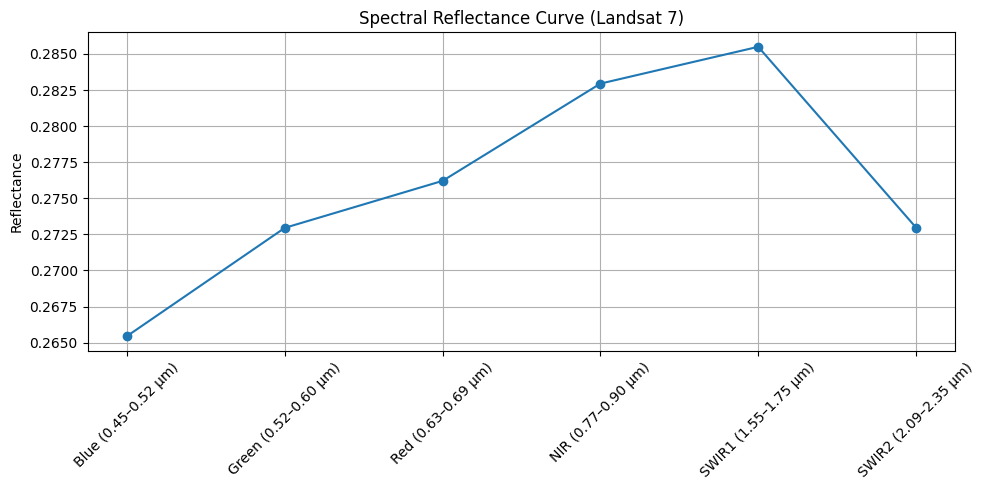

In [ ]:
# Extract and scale values
mean_values = mean_dict.getInfo()
reflectance = [mean_values[b] * scale_factor for b in bands]

# Plot the spectral curve
plt.figure(figsize=(10, 5))
plt.plot(list(band_names.values()), reflectance, marker='o', linestyle='-')
plt.title('Spectral Reflectance Curve (Landsat 7)')
plt.ylabel('Reflectance')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
mean_values

{'SR_B1': 9652.664958006388,
 'SR_B2': 9925.442569299315,
 'SR_B3': 10043.854855881073,
 'SR_B4': 10288.878001656085,
 'SR_B5': 10381.604077126296,
 'SR_B7': 9926.202633965539}

(6) If we want to apply multiple reducers to the same inputs what is a more efficient way to do so than just writing out a long series of sequential reducers on our end? (2 pts)

"Specifically, calling combine() on a reducer with sharedInputs set to true will result in only a single pass over the data. For example, to compute the mean and standard deviation of pixels in an image, you could use something like this"

is what is said in the description on the documentation page under Combining Reducers section.

In [ ]:

combined_reducer = ee.Reducer.mean(
).combine(
    reducer2=ee.Reducer.min(),
    sharedInputs=True # 'sharedInputs=True' tells GEE that all reducers should process the same input band
).combine(
    reducer2=ee.Reducer.max(),
    sharedInputs=True
).combine(
    reducer2=ee.Reducer.stdDev(),
    sharedInputs=True
)

# Apply the combined reducer in a single reduceRegion call
stats = image.reduceRegion(
    reducer=combined_reducer,
    geometry=region,
    scale=30,
    maxPixels=1e6
)

print(stats.getInfo())

{'QA_PIXEL_max': 5896, 'QA_PIXEL_mean': 5560.580182169472, 'QA_PIXEL_min': 5440, 'QA_PIXEL_stdDev': 159.19818933488378, 'QA_RADSAT_max': 0, 'QA_RADSAT_mean': 0, 'QA_RADSAT_min': 0, 'QA_RADSAT_stdDev': 0, 'SR_ATMOS_OPACITY_max': 69, 'SR_ATMOS_OPACITY_mean': 68.83939907732342, 'SR_ATMOS_OPACITY_min': 68, 'SR_ATMOS_OPACITY_stdDev': 0.39613545398407474, 'SR_B1_max': 13359, 'SR_B1_mean': 9652.664958006388, 'SR_B1_min': 8028, 'SR_B1_stdDev': 1049.8777398349682, 'SR_B2_max': 14107, 'SR_B2_mean': 9925.442569299315, 'SR_B2_min': 8153, 'SR_B2_stdDev': 1152.818261097469, 'SR_B3_max': 14649, 'SR_B3_mean': 10043.854855881073, 'SR_B3_min': 7922, 'SR_B3_stdDev': 1268.4256018376861, 'SR_B4_max': 14319, 'SR_B4_mean': 10288.878001656085, 'SR_B4_min': 7829, 'SR_B4_stdDev': 1248.7557367132058, 'SR_B5_max': 18242, 'SR_B5_mean': 10381.604077126296, 'SR_B5_min': 7636, 'SR_B5_stdDev': 1546.8828366098776, 'SR_B7_max': 16854, 'SR_B7_mean': 9926.202633965539, 'SR_B7_min': 7390, 'SR_B7_stdDev': 1398.329135206627,

---


# Cloud cover
A final consideration that I want to cover in this lab is that of cloud cover. Cloud cover removal is a complex and often difficut process that GISCI 341 students spend an entire two weeks tackling as a focus (so use them in your teams!). However, for our purpose here lets just use the basic in-built cloud clearing native to the Landsat 7 collection on GEE.

In [ ]:
# Define small region around Auckland, NZ
point = ee.Geometry.Point([174.7633, -36.8485])
region = point.buffer(500).bounds()

# Load the image with least cloud cover in 2002
image = ee.ImageCollection("LANDSAT/LE07/C02/T1_L2") \
    .filterBounds(region) \
    .filterDate("2002-01-01", "2002-12-31") \
    .sort("CLOUD_COVER") \
    .first() #<- note the filtering step that is being applied here! We are taking the first image in a sorted by cloud cover response.

# Check metadata
print('Image ID:', image.get('LANDSAT_PRODUCT_ID').getInfo())
print('Cloud Cover (whole scene):', image.get('CLOUD_COVER').getInfo())

Image ID: LE07_L2SP_073086_20020827_20200916_02_T1
Cloud Cover (whole scene): 1


In [ ]:
# Function to mask clouds using QA_PIXEL band
def mask_clouds(image):
    qa = image.select('QA_PIXEL')
    # Bits 3 and 4 are cloud and cloud shadow respectively
    cloud_mask = qa.bitwiseAnd(1 << 3).eq(0).And(
                 qa.bitwiseAnd(1 << 4).eq(0))
    return image.updateMask(cloud_mask)

# Apply mask
masked_image = mask_clouds(image)

**Important side note**

In the function above we are using a bitwise operation in order to search through the quality assurance (QA) band of the image. Different satellites have different bit-masks. Read more about bitmasks and how they are used here:
*   https://spatialthoughts.com/2021/08/19/qa-bands-bitmasks-gee/



**Another important side note**

You will have noticed that we are frequently running code and not seeing anything happen in terms of output in the cell or changes in the RAM/Disk of the Colab instance (check the small graphs top right). This is deliberate! Satellite data is large and hard to wrangle. GEE does a lot of the work for us, hence we can explore and get into it so quickly. Part of how it does this is by not executing any of your API calls until you specifically ask for an output to be sent back to you. Prior to calling an output (usually through a 'AddLayer' or similar call), when using the GEE/EE API you are essentially chaining together a lot of dot-operators (e.g. '.sort \ .reduce') into a series of instructions that are verified, but only then acted on when required.

This is the result of a 'client vs. server' approach. For more detail, that will help you understand why you can and cannot do certain things, see:
*   https://developers.google.com/earth-engine/guides/client_server



In [ ]:
# Report Image Quality Over ROI
# Total pixels in region
pixel_area = ee.Image.pixelArea().clip(region)
#pixelArea() accounts for Earth's curvature (geodesic math) so area calculations remain accurate anywhere on Earth.

# Count valid pixels before and after masking
total_pixels = pixel_area.reduceRegion(
    reducer=ee.Reducer.count(),
    geometry=region,
    scale=30,
    maxPixels=1e9
).getInfo()['area']

valid_pixels = masked_image.select('SR_B3').reduceRegion(#we can look into different bands too; itd doesn't matter; they give similar results
    reducer=ee.Reducer.count(),
    geometry=region,
    scale=30,
    maxPixels=1e9
).getInfo()['SR_B3']

cloud_coverage_pct = 100 * (1 - valid_pixels / total_pixels)

print(f"Total Pixels: {total_pixels}")
print(f"Valid (non-cloud) Pixels: {valid_pixels}")
print(f"Estimated Cloud Coverage in ROI: {cloud_coverage_pct:.2f}%")

Total Pixels: 1394
Valid (non-cloud) Pixels: 1050
Estimated Cloud Coverage in ROI: 24.68%


In [ ]:
pixel_area_image = image.pixelArea().clip(region)

total_pixels = pixel_area_image.reduceRegion(
    reducer=ee.Reducer.count(),
    geometry=region,
    scale=30,
    maxPixels=1e9
).getInfo()['area']

valid_pixels = masked_image.select('SR_B3').reduceRegion(
    reducer=ee.Reducer.count(),
    geometry=region,
    scale=30,
    maxPixels=1e9
).getInfo()['SR_B3']

cloud_coverage_pct = 100 * (1 - valid_pixels / total_pixels)

print(f"Total Pixels: {total_pixels}")
print(f"Valid (non-cloud) Pixels: {valid_pixels}")
print(f"Estimated Cloud Coverage in ROI: {cloud_coverage_pct:.2f}%")

In [ ]:
pixel_area

In [ ]:
# Visualize the before and after
Map = geemap.Map(center=[-36.8485, 174.7633],
                 zoom=12)

vis = {
    'bands': ['SR_B3', 'SR_B2', 'SR_B1'],
    'min': 0,
    'max': 30000,
    'gamma': 1.4
}

Map.addLayer(image, vis, 'Original Image (Cloudy)')
Map.addLayer(masked_image, vis, 'Cloud Masked')
Map

(7) Produce a table that tells me the average amount of cloud cover per LandSat image in a year: for 2005, 2010 and 2015. Do this over a region of your choice, as a percentage.

Provide a notebook example of your code that does so, in addition to your table. (5 pts)

In [ ]:
import pandas as pd

#THIS IS HINAMI JUST EXIPERIMENTING with the code:
#AOI + 10km buffer
point = ee.Geometry.Point([175.26186805450718, -37.77029504994626, ])#Hamilton
region = point.buffer(10000)

# Load and filter the Landsat 7 Collection for 2005
collection_2005 = (
    ee.ImageCollection("LANDSAT/LE07/C02/T1_L2")
    .filterBounds(region)
    .filterDate("2005-01-01", "2005-12-31")
)

#Calculate average cloud cover percentage across all 2005 scenes
avg_cloud_2005 = collection_2005.aggregate_mean("CLOUD_COVER").getInfo()

#Count total images analyzed in 2005
total_images_2005 = collection_2005.size().getInfo()

# Format results into a Pandas DataFrame table
df_2005 = pd.DataFrame(
    [
        {
            "Year": 2005,
            "Average Cloud Cover (%)": round(avg_cloud_2005, 2),
            "Total Images Analyzed": total_images_2005,
        }
    ]
)

print(df_2005)

In [ ]:
#_____‼️_‼️_‼️________________________________________
# THIS ONE FOR ASSESSMENT PLEASE (TASK 7)
#______________________________________________________
#AOI + 10km buffer
point = ee.Geometry.Point([175.26186805450718, -37.77029504994626, ])#Hamilton
region = point.buffer(10000)

years = [2005, 2010, 2015]
table_data = []

# For loop to compute average cloud cover per year
for yr in years:
    # Filter collection for the region and year
    collection = (
        ee.ImageCollection("LANDSAT/LE07/C02/T1_L2")
        .filterBounds(region)
        .filterDate(f"{yr}-01-01", f"{yr}-12-31")
    )

    # Calculate average cloud cover across all images in that year
    avg_cloud = collection.aggregate_mean("CLOUD_COVER").getInfo()

    # Count total images analyzed in that year
    img_count = collection.size().getInfo()

    # Append row
    table_data.append({
        "Year": yr,
        "Average Cloud Cover (%)": round(avg_cloud, 2),
        "Total Images Analyzed": img_count
    })

#  Create Pandas DataFrame (Table)
df_cloud_table = pd.DataFrame(table_data)
print(df_cloud_table)

---

In [ ]:
# THIS IS HINAMI EXPERIMENTING WITH THE CODE; PLEASE IGNORE
# Function to mask clouds using QA_PIXEL band
def mask_clouds(image):
    qa = image.select('QA_PIXEL')
    cloud_mask = qa.bitwiseAnd(1 << 3).eq(0).And(#Bits 3=cloud
                 qa.bitwiseAnd(1 << 4).eq(0)) # Bits 4=cloud shadow
    return image.updateMask(cloud_mask)

# Define small region around Auckland, NZ
point = ee.Geometry.Point([174.7633, -36.8485])
region = point.buffer(500).bounds()

# Median Composite + cloud masked image:
image_2005 = (
    ee.ImageCollection("LANDSAT/LE07/C02/T1_L2")
    .filterBounds(region)
    .filterDate("2005-01-01", "2005-12-31")
    .map(mask_clouds)# Mask clouds on images in 2005
    .median()# Take median of only clear ground pixels!
)

# Report Image Quality Over ROI
# Total pixels in region
pixel_area_2005 = ee.Image.pixelArea().clip(region)

# Count valid pixels before and after masking
total_pixels_2005 = pixel_area_2005.reduceRegion(
    reducer=ee.Reducer.count(),
    geometry=region,
    scale=30,
    maxPixels=1e9
).getInfo()['area']

valid_pixels_2005 = image_2005.select('SR_B3').reduceRegion(
    reducer=ee.Reducer.count(),
    geometry=region,
    scale=30,
    maxPixels=1e9
).getInfo()['SR_B3']

cloud_coverage_pct_2005 = 100 * (1 - valid_pixels_2005 / total_pixels_2005)

print(f"Total Pixels for 2005: {total_pixels_2005}")
print(f"Valid (non-cloud) Pixels for 2005: {valid_pixels_2005}")
print(f"Estimated Cloud Coverage in ROI for 2005: {cloud_coverage_pct_2005:.2f}%")

---

# Final exercise
Let us now be very fancy and plot our spectral reflectance curve along with a display of the satellite data that it was generated from. As well as being fancy, this lets us see that what we have done here is sample the urban fabric of downtown Auckland and collect the spectral signature of 'urban'.

The code block below is large and calls in some further packages as we start to push beyond what is already built into geemap. I have also placed all the required code in one cell as I am about to ask you to do something with it... Make sure that you take the time understand what each section is doing and why. Consider starting to break this code down into functions that you can re-use later. If you do not know what I mean by this, please ask! (And Google 'modular code design, functions').

In [ ]:
# FROM TOM-------------------------------------

# Additional required packages
import matplotlib.patches as patches
import urllib.request
import tempfile
import matplotlib.image as mpimg

# Define point and regions
point = ee.Geometry.Point([174.7633, -36.8485])
region = point.buffer(150).bounds()        # ~300 m box
expanded_region = point.buffer(1000).bounds()  # box for image preview

# Load Landsat 7 surface reflectance image
image = ee.ImageCollection('LANDSAT/LE07/C02/T1_L2') \
    .filterBounds(region) \
    .filterDate('2002-01-01', '2002-12-31') \
    .sort('CLOUD_COVER') \
    .first()

# Define bands and scaling
bands = ['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B7']
band_names = {
    'SR_B1': 'Blue (0.45–0.52 μm)',
    'SR_B2': 'Green (0.52–0.60 μm)',
    'SR_B3': 'Red (0.63–0.69 μm)',
    'SR_B4': 'NIR (0.77–0.90 μm)',
    'SR_B5': 'SWIR1 (1.55–1.75 μm)',
    'SR_B7': 'SWIR2 (2.09–2.35 μm)'
}
scale_factor = 2.75e-5

# Calculate mean reflectance
mean_dict = image.select(bands).reduceRegion(
    reducer=ee.Reducer.mean(),
    geometry=region,
    scale=30,
    maxPixels=1e6).getInfo()

reflectance = [mean_dict[b] * scale_factor for b in bands]
labels = list(band_names.values())

# Get RGB thumbnail slightly zoomed out
thumb_params = {
    'dimensions': 512,
    'region': expanded_region,
    'format': 'png',
    'bands': ['SR_B3', 'SR_B2', 'SR_B1'],
    'min': 0,
    'max': 30000,
    'gamma': 1.4
}
url = image.getThumbURL(thumb_params)

# Get coordinates of regions
def get_bounds_coords(bounds):
    coords = bounds.coordinates().getInfo()[0]
    lons = [pt[0] for pt in coords]
    lats = [pt[1] for pt in coords]
    return min(lons), max(lons), min(lats), max(lats)

# Extract bounding boxes
xmin, xmax, ymin, ymax = get_bounds_coords(expanded_region)
rxmin, rxmax, rymin, rymax = get_bounds_coords(region)

# Plot both panels
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8), gridspec_kw={'height_ratios': [2, 1]})

# Load and plot image with annotation
with tempfile.NamedTemporaryFile(suffix=".png") as f:
    urllib.request.urlretrieve(url, f.name)
    img = mpimg.imread(f.name)
    ax1.imshow(img, extent=[xmin, xmax, ymin, ymax])
    ax1.set_title("Landsat 7 Image")
    ax1.set_xlim(xmin, xmax)
    ax1.set_ylim(ymin, ymax)

    # Add red rectangle for region of interest
    width = rxmax - rxmin
    height = rymax - rymin
    rect = patches.Rectangle((rxmin, rymin), width, height,
                             linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)
    ax1.set_xlabel("Longitude")
    ax1.set_ylabel("Latitude")

# Plot reflectance
ax2.plot(labels, reflectance, marker='o', color='blue')
ax2.set_title("Spectral Reflectance Curve")
ax2.set_ylabel("Reflectance")
ax2.set_xticks(range(len(labels)))
ax2.set_xticklabels(labels, rotation=45, ha='right')
ax2.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
# Hinami's Notes + comments-------------------------------------

# Additional required packages
import matplotlib.patches as patches#matplotlib: Handles layout creation, image rendering (mpimg), drawing bounding box shapes (patches), and plotting line charts.
import urllib.request#urllib & tempfile: Used to download the satellite thumbnail image generated by Google Earth Engine via its URL and store it temporarily on disk so Matplotlib can display it.
import tempfile
import matplotlib.image as mpimg

# Define point and regions
point = ee.Geometry.Point([174.7633, -36.8485])#Sets a central coordinate for Auckland, New Zealand ([174.7633, -36.8485]).
region = point.buffer(150).bounds()        # region: Creates a smaller square box (~300m x 300m) around the center point, which serves as the Sampling Region of Interest (ROI).
expanded_region = point.buffer(1000).bounds()  # box for image preview
#expanded_region: Creates a larger square box (~2km x 2km) to give visual context around the sampled ROI in the output preview image.


# Load Landsat 7 surface reflectance image
#Searches the Landsat 7 Surface Reflectance Collection 2 Level 2 dataset for images intersecting the study area in 2002, sorts them by cloud cover, and retrieves the least cloudy scene.
image = ee.ImageCollection('LANDSAT/LE07/C02/T1_L2') \
    .filterBounds(region) \
    .filterDate('2002-01-01', '2002-12-31') \
    .sort('CLOUD_COVER') \
    .first()

# Define bands and scaling
bands = ['SR_B1', 'SR_B2', 'SR_B3', 'SR_B4', 'SR_B5', 'SR_B7']
band_names = {
    'SR_B1': 'Blue (0.45–0.52 μm)',
    'SR_B2': 'Green (0.52–0.60 μm)',
    'SR_B3': 'Red (0.63–0.69 μm)',
    'SR_B4': 'NIR (0.77–0.90 μm)',
    'SR_B5': 'SWIR1 (1.55–1.75 μm)',
    'SR_B7': 'SWIR2 (2.09–2.35 μm)'
}
scale_factor = 2.75e-5

# Calculate mean reflectance
mean_dict = image.select(bands).reduceRegion(
    reducer=ee.Reducer.mean(),
    geometry=region,
    scale=30,
    maxPixels=1e6).getInfo()

reflectance = [mean_dict[b] * scale_factor for b in bands]
labels = list(band_names.values())

# Get RGB thumbnail slightly zoomed out
thumb_params = {
    'dimensions': 512,
    'region': expanded_region,
    'format': 'png',
    'bands': ['SR_B3', 'SR_B2', 'SR_B1'],
    'min': 0,
    'max': 30000,
    'gamma': 1.4
}
url = image.getThumbURL(thumb_params)

# Get coordinates of regions
def get_bounds_coords(bounds):
    coords = bounds.coordinates().getInfo()[0]
    lons = [pt[0] for pt in coords]
    lats = [pt[1] for pt in coords]
    return min(lons), max(lons), min(lats), max(lats)

# Extract bounding boxes
xmin, xmax, ymin, ymax = get_bounds_coords(expanded_region)
rxmin, rxmax, rymin, rymax = get_bounds_coords(region)

# Plot both panels
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8), gridspec_kw={'height_ratios': [2, 1]})

# Load and plot image with annotation
with tempfile.NamedTemporaryFile(suffix=".png") as f:
    urllib.request.urlretrieve(url, f.name)
    img = mpimg.imread(f.name)
    ax1.imshow(img, extent=[xmin, xmax, ymin, ymax])
    ax1.set_title("Landsat 7 Image")
    ax1.set_xlim(xmin, xmax)
    ax1.set_ylim(ymin, ymax)

    # Add red rectangle for region of interest
    width = rxmax - rxmin
    height = rymax - rymin
    rect = patches.Rectangle((rxmin, rymin), width, height,
                             linewidth=2, edgecolor='red', facecolor='none')
    ax1.add_patch(rect)
    ax1.set_xlabel("Longitude")
    ax1.set_ylabel("Latitude")

# Plot reflectance
ax2.plot(labels, reflectance, marker='o', color='blue')
ax2.set_title("Spectral Reflectance Curve")
ax2.set_ylabel("Reflectance")
ax2.set_xticks(range(len(labels)))
ax2.set_xticklabels(labels, rotation=45, ha='right')
ax2.grid(True)

plt.tight_layout()
plt.show()


(8) Exercise: Using Sentinel 2, create a figure that does the following over the city of Christchurch, NZ:
*   Conduct a basic quality assessment of the data you use by stating how much of your area is covered by cloud.
* Show the spectral reflectance signatures of: urban, forest, grassland, water and bare soil. Using a line graph that stacks them all onto the same axes.
* Gives examples of the sample areas that you have used to create these spectral signatures.

Provide a publication quality copy of this figure in the answer proforma. Publication quality means that:  
1.   It is at a good quality (resolution) and not blurry.
2.   The font size of all elements is big enough to read easily on a screen when placed in the document.
3. Has a figure caption that ensures the reader knows what you have done and why.
4. Tells the story 'at a glance'. Don't make your viewer work too hard to understand your core message.

See the Nature guide linked at the start of this lab for more detail on what I expect.

(25 pts)




Selected Scene: S2B_MSIL2A_20230118T222539_N0509_R029_T59GPM_20230118T234026
Scene Cloud Coverage: 4.04%


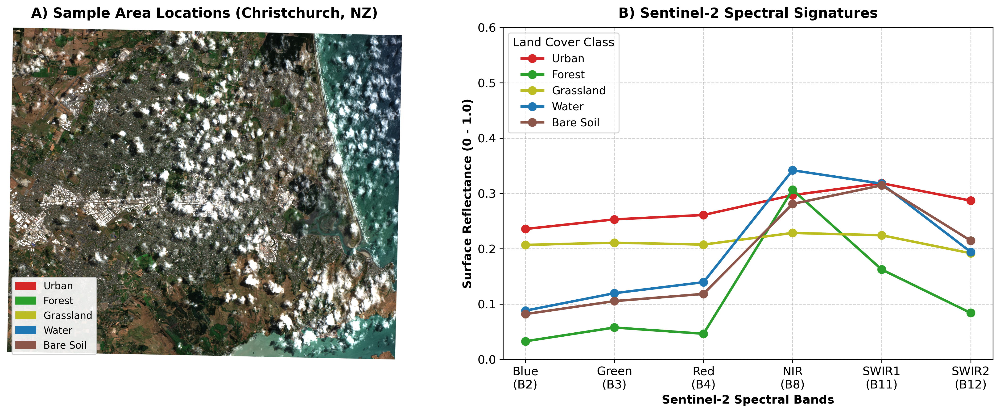

In [ ]:
import ee
import geemap
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd

# ---------------------------------------------------------
# 1. DEFINE STUDY AREA & SAMPLE POINTS (Christchurch, NZ)
# ---------------------------------------------------------
# Bounding region around Christchurch
chch_box = ee.Geometry.BBox(172.50, -43.62, 172.78, -43.45)

# Representative sample locations (Points)
samples = {
    'Urban': ee.Geometry.Point([172.636, -43.532]),      # CBD / Buildings
    'Forest': ee.Geometry.Point([172.705, -43.585]),     # Port Hills plantation / trees
    'Grassland': ee.Geometry.Point([172.570, -43.540]),  # Agricultural pasture / park
    'Water': ee.Geometry.Point([172.720, -43.525]),      # Avon-Heathcote Estuary / Sea
    'Bare Soil': ee.Geometry.Point([172.535, -43.600])   # Exposed paddock / quarry
}

# Combine sample points into a FeatureCollection for visualization
sample_features = [ee.Feature(geom, {'class': name}) for name, geom in samples.items()]
sample_fc = ee.FeatureCollection(sample_features)

# ---------------------------------------------------------
# 2. LOAD SENTINEL-2 HARMONIZED & ASSESS CLOUD COVER
# ---------------------------------------------------------
# Sentinel-2 Surface Reflectance (S2_SR_HARMONIZED)
s2_col = (ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
          .filterBounds(chch_box)
          .filterDate('2023-01-01', '2023-03-31')
          .sort('CLOUDY_PIXEL_PERCENTAGE'))

# Pick the least cloudy image in summer 2023
s2_image = s2_col.first()

# Quality Assessment: Get exact scene cloud cover and image metadata
cloud_pct = s2_image.get('CLOUDY_PIXEL_PERCENTAGE').getInfo()
scene_id = s2_image.get('PRODUCT_ID').getInfo()
print(f"Selected Scene: {scene_id}")
print(f"Scene Cloud Coverage: {cloud_pct:.2f}%")

# ---------------------------------------------------------
# 3. EXTRACT SPECTRAL REFLECTANCE SIGNATURES
# ---------------------------------------------------------
# S2 SR bands & scale factor (Sentinel-2 SR values are scaled by 10,000)
s2_bands = ['B2', 'B3', 'B4', 'B8', 'B11', 'B12']
band_labels = ['Blue\n(B2)', 'Green\n(B3)', 'Red\n(B4)', 'NIR\n(B8)', 'SWIR1\n(B11)', 'SWIR2\n(B12)']

# Extract reflectance for 50m buffers around each sample point
class_colors = {
    'Urban': '#d62728',     # Red
    'Forest': '#2ca02c',    # Green
    'Grassland': '#bcbd22', # Yellow-Green
    'Water': '#1f77b4',     # Blue
    'Bare Soil': '#8c564b'  # Brown
}

spectral_data = {}

for name, pt in samples.items():
    roi = pt.buffer(50)  # 50m radius buffer
    stats = s2_image.select(s2_bands).reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=roi,
        scale=10,
        maxPixels=1e6
    ).getInfo()

    # Scale raw values (0 - 10,000) to True Reflectance (0.0 - 1.0)
    reflectance = [stats[b] / 10000.0 if stats[b] is not None else 0 for b in s2_bands]
    spectral_data[name] = reflectance

# ---------------------------------------------------------
# 4. PUBLICATION-QUALITY FIGURE GENERATION
# ---------------------------------------------------------
# Set font standard for publication
plt.rcParams.update({'font.size': 12, 'font.family': 'sans-serif'})

fig, (ax_map, ax_spec) = plt.subplots(1, 2, figsize=(15, 6), dpi=300)

# Panel A: Thumbnail Map of Christchurch with Sample Locations
# Get a true-color thumbnail of the scene
vis_params = {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 3000}
thumb_url = s2_image.clip(chch_box).getThumbURL(vis_params)

import urllib.request
from PIL import Image

urllib.request.urlretrieve(thumb_url, 'chch_thumb.png')
img_map = Image.open('chch_thumb.png')

ax_map.imshow(img_map)
ax_map.set_title("A) Sample Area Locations (Christchurch, NZ)", fontsize=14, fontweight='bold', pad=10)
ax_map.axis('off')

# Annotate sample locations on thumbnail map
# Add legend for map sample markers
patches = [mpatches.Patch(color=color, label=label) for label, color in class_colors.items()]
ax_map.legend(handles=patches, loc='lower left', frameon=True, facecolor='white', framealpha=0.9, fontsize=10)

# Panel B: Stacked Spectral Reflectance Curves
for label, values in spectral_data.items():
    ax_spec.plot(band_labels, values, marker='o', linewidth=2.5, markersize=8,
                 color=class_colors[label], label=label)

ax_spec.set_title("B) Sentinel-2 Spectral Signatures", fontsize=14, fontweight='bold', pad=10)
ax_spec.set_ylabel("Surface Reflectance (0 - 1.0)", fontsize=12, fontweight='bold')
ax_spec.set_xlabel("Sentinel-2 Spectral Bands", fontsize=12, fontweight='bold')
ax_spec.set_ylim(0, 0.6)
ax_spec.grid(True, linestyle='--', alpha=0.6)
ax_spec.legend(title="Land Cover Class", fontsize=11, title_fontsize=12, loc='upper left')

plt.tight_layout()
plt.savefig('Sentinel2_Christchurch_Spectral_Signatures.png', bbox_inches='tight', dpi=300)
plt.show()

---

The Code Chunk below is my first fustrating attempt. The output looked wrong, because...


ESA stopped populating the QA60 cloud mask band for Sentinel-2 L2A products processed after around late January 2022. Your image is from September 2024, so its QA60 band is essentially empty/fully masked — not just "few clouds," but no valid data at all in that band. When you do:

In [ ]:
# St. Albans Park
christchurch_coordinates = [172.63692315097373, -43.53206590013776]
aoi_point = ee.Geometry.Point(christchurch_coordinates)
aoi_region = aoi_point.buffer(150).bounds()
expanded_aoi = aoi_point.buffer(7000).bounds()  # box for image preview

from_date = '2024-01-01'
to_date = '2024-12-31'

cloud_img = (
    ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
    .filterBounds(aoi_point)
    .filterDate(from_date, to_date)
    .sort('CLOUDY_PIXEL_PERCENTAGE')
    .first()
)

print('Image ID in Christchurch: ', cloud_img.get('PRODUCT_ID').getInfo())
print('Cloud Cover (whole scene) in Christchurch: ', cloud_img.get('CLOUDY_PIXEL_PERCENTAGE').getInfo())
print('Over Land Cloud Cover (whole scene) in Christchurch: ', cloud_img.get('CLOUDY_PIXEL_OVER_LAND_PERCENTAGE').getInfo())
print()

# NOTE: QA60 is deprecated for Sentinel-2 L2A products processed after
# ~Jan 2022 and is retained here only to show the initial (incorrect)
# approach. It is not used in the final analysis below.
def mask_s2_clouds(image):
  """Masks clouds in a Sentinel-2 image using the QA band.

  Args:
      image (ee.Image): A Sentinel-2 image.

  Returns:
      ee.Image: A cloud-masked Sentinel-2 image.
  """
  qa = image.select('QA60')

 #Bit Mask:  10=Opaque clouds,Bit 11=Cirrus clouds
  #Both flags should be set to zero, indicating clear conditions.
  mask = qa.bitwiseAnd(1 << 10).eq(0).And(
         qa.bitwiseAnd(1 << 11).eq(0))
  return image.updateMask(mask).divide(10000)


#update
def mask_s2_clouds_scl(image):
    """Masks clouds and cloud shadows in a Sentinel-2 image using the SCL band.

    QA60 is deprecated in recent S2 L2A products, so SCL (Scene Classification
    Layer) is the current, reliable way to identify clouds per pixel.

    SCL classes masked out:
      0 = no data, 1 = saturated/defective,
      3 = cloud shadow, 8 = cloud (medium prob),
      9 = cloud (high prob), 10 = thin cirrus

    Args:
        image (ee.Image): A Sentinel-2 SR image.

    Returns:
        ee.Image: A cloud-masked, reflectance-scaled Sentinel-2 image.
    """
    scl = image.select('SCL')
    mask = (
        scl.neq(0)
        .And(scl.neq(1))
        .And(scl.neq(3))
        .And(scl.neq(8))
        .And(scl.neq(9))
        .And(scl.neq(10))
    )
    return image.updateMask(mask).divide(10000)


# Apply cloud masking
masked_image = mask_s2_clouds_scl(cloud_img)


# --- Report Image Quality Over ROI ---
# Denominator: pixels actually covered by the image footprint in the ROI
# (NOT raw geometric area — the S2 tile swath doesn't perfectly cover
# every rectangle, so using area alone overcounts "missing" pixels)
footprint_valid_pixels = cloud_img.select('B4').reduceRegion(
    reducer=ee.Reducer.count(),
    geometry=aoi_region,
    scale=10,
    maxPixels=1e9
).getInfo()['B4']

# Numerator: pixels remaining after cloud/shadow masking
cloud_free_pixels = masked_image.select('B4').reduceRegion(
    reducer=ee.Reducer.count(),
    geometry=aoi_region,
    scale=10,
    maxPixels=1e9
).getInfo()['B4']

cloud_coverage_pct = 100 * (1 - cloud_free_pixels / footprint_valid_pixels)

print(f"Image footprint pixels in ROI: {footprint_valid_pixels}")
print(f"Cloud-free pixels: {cloud_free_pixels}")
print(f"Estimated Cloud Coverage in ROI: {cloud_coverage_pct:.2f}%")

Image ID in Christchurch:  S2A_MSIL2A_20240904T222541_N0511_R029_T59GPM_20240905T020950
Cloud Cover (whole scene) in Christchurch:  0.000717
Over Land Cloud Cover (whole scene) in Christchurch:  0.000497

Image footprint pixels in ROI: 893
Cloud-free pixels: 893
Estimated Cloud Coverage in ROI: 0.00%


---

Summer Date:
Dec-Feb

In [ ]:

# 1. Define your area of interest (AOI) and date range
aoi = ee.Geometry.Point([174.7633, -36.8485])  # Example: Auckland CBD
start_date = '2026-01-01'
end_date = '2026-03-31'

# 2. Define cloud masking function using QA60
def mask_s2_clouds(image):
    qa = image.select('QA60')

    # Bits 10 and 11 are clouds and cirrus, respectively.
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11

    # Both flags should be set to zero, indicating clear conditions.
    mask = (qa.bitwiseAnd(cloud_bit_mask).eq(0)
            .And(qa.bitwiseAnd(cirrus_bit_mask).eq(0)))

    return image.updateMask(mask).divide(10000)

# 3. Load and process the collection
collection = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
              .filterBounds(aoi)
              .filterDate(start_date, end_date)
              # Pre-filter for images that aren't completely covered in clouds
              .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 30))
              .map(mask_s2_clouds))

# 4. Create a cloud-free median composite
cloud_free_image = collection.median()

# 5. Extract visualization URL or integrate with geemap
# (Optional: Use geemap if you want an interactive map in your notebook)
import geemap
Map = geemap.Map()
Map.centerObject(aoi, 11)
Map.addLayer(cloud_free_image, {'bands': ['B4', 'B3', 'B2'], 'min': 0, 'max': 0.3}, 'Cloud-Free')
Map


TimeoutException: Requesting secret GOOGLE_MAPS_API_KEY timed out. Secrets can only be fetched when running from the Colab UI.

In [ ]:
import ee

# ----------------- SENTINEL-2 advanced cloud removal -----------------
# Adapted from SimpleCloudScore by Chris Herwig, 2016

S2_BANDS = ['B2', 'B3', 'B4', 'B8', 'B11', 'B12']
STD_NAMES = ['blue', 'green', 'red', 'nir', 'swir1', 'swir2']


def cloud_score(img):
    def rescale(image, exp, thresholds):
        return (image.expression(exp, {'img': image})
                     .subtract(thresholds[0])
                     .divide(thresholds[1] - thresholds[0]))

    score = ee.Image(1.0)

    # Adjusted thresholds based on inspector values
    score = score.min(rescale(img, 'img.blue', [0.03, 0.12]))  # blue band brightness
    score = score.min(rescale(img, 'img.red + img.green + img.blue', [0.2, 0.25]))  # visible bands combined
    score = score.min(rescale(img, 'img.nir + img.swir1 + img.swir2', [0.6, 0.75]))  # infrared brightness

    ndsi = img.normalizedDifference(['green', 'swir1'])
    score = score.min(rescale(ndsi, 'img', [0.4, 0.6]))  # snow/cloud separation

    return score


# Summer
start_date = '2018-12-01'
end_date = '2019-02-28'

# Define your area of interest (replace with your actual geometry/feature)
Queenstown = ee.Geometry.Point([168.6626, -45.0312])
Queenstown = Queenstown  # assumes this is already defined elsewhere

# -------------------- Surface Reflectance Apply ---------------------------------------------------
def process_image(img):
    img = img.divide(10000)
    # Invert the cloudscore so 1 is least cloudy, and rename the band.
    score = cloud_score(img.select(S2_BANDS, STD_NAMES))
    score = (ee.Image(1).subtract(score)
                        .select([0], ['cloudscore'])
                        .clip(Queenstown))
    return img.select(S2_BANDS, STD_NAMES).addBands(score)


collection = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
              .filterBounds(Queenstown)
              .filterDate(start_date, end_date)
              .map(process_image))

viz_params = {'bands': ['red', 'green', 'blue'], 'max': 0.4, 'gamma': 1.6}

# ______Applying the Binary Mask______________________________________________________
cloud_threshold = 0.5


def mask_clouds(img):
    cloud_mask = img.select('cloudscore').gt(cloud_threshold)
    return img.updateMask(cloud_mask)


masked_collection = collection.map(mask_clouds)
# ______________________________________________________________________________________________________________

viz_params = {'bands': ['red', 'green', 'blue'], 'max': 0.4, 'gamma': 1.6}
import geemap

Map = geemap.Map()
Map.centerObject(Queenstown, 9)

# Map.addLayer(masked_collection.min().clip(Queenstown), viz_params,
#              'Sentinel-2(SR) Cloud Score(Binary Mask + min Composite)')

Map.addLayer(
    masked_collection.qualityMosaic('cloudscore').clip(Queenstown),
    viz_params,
    'Sentinel-2(SR) Cloud Score(Binary Mask + CloudScore Composite)'
)  # create a clearest pixel composite (where 1 = clear and 0 = cloudy)

Map

In [ ]:
composite = masked_collection.qualityMosaic('cloudscore').clip(Queenstown)
stats = composite.select(['red','green','blue']).reduceRegion(
    reducer=ee.Reducer.minMax(),
    geometry=Queenstown,
    scale=100,
    maxPixels=1e9
)
print(stats.getInfo())

Map = geemap.Map()
Map.centerObject(Queenstown, 9)
Map.addLayer(composite, {'bands': ['red','green','blue'], 'min':0, 'max':1}, 'test - stretched')
print(Map.layers)

# Hinami

In [ ]:

# AOI around Christchurch (University of Canterbury)
aoi_point = ee.Geometry.Point([172.5802801427398, -43.52173383052375])
aoi_region = point.buffer(150).bounds()
expanded_aoi = point.buffer(10000).bounds()


# # Load Sentinel-2 L2A collection for a summer month
# Summer is less cloudy - summer season
from_date = '2025-12-01'
to_date = '2026-02-28'

cloud_img = (
    ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
    .filterBounds(aoi_point)
    .filterDate(from_date, to_date)
    .sort('CLOUDY_PIXEL_PERCENTAGE')
    .first()
)

print('Image ID in Christchurch: ', cloud_img.get('PRODUCT_ID').getInfo())
print('Cloud Cover (whole scene) in Christchurch: ', cloud_img.get('CLOUDY_PIXEL_PERCENTAGE').getInfo())
print('Over Land Cloud Cover (whole scene) in Christchurch: ', cloud_img.get('CLOUDY_PIXEL_OVER_LAND_PERCENTAGE').getInfo())


In [ ]:
from IPython.display import Image
# Get RGB thumbnail of Christchurch
def thumb_params(region):
    return {
        'region': region,
        'format': 'png',
        'bands': ['B4', 'B3', 'B2'],
        'min': 0,
        'max': 3000,
        'gamma': 1
    }
roi_url = cloud_img.getThumbURL(thumb_params(expanded_aoi))

Image(url=roi_url)

## FUNCTIONS

In [ ]:

def mask_s2_clouds(image):
  """Masks clouds in a Sentinel-2 image using the QA band.

  Args:
      image (ee.Image): A Sentinel-2 image.

  Returns:
      ee.Image: A cloud-masked Sentinel-2 image.
  """
  qa = image.select('QA60')

 #Bit Mask:  10=Opaque clouds,Bit 11=Cirrus clouds
  #Both flags should be set to zero, indicating clear conditions.
  mask = qa.bitwiseAnd(1 << 10).eq(0).And(
         qa.bitwiseAnd(1 << 11).eq(0))

  return image.updateMask(mask).divide(10000)

In [ ]:
# Report Image Quality Over ROI
# Total pixels in region
pixel_area = ee.Image.pixelArea().clip(aoi_region)

# Count valid pixels before and after masking
total_pixels = pixel_area.reduceRegion(
    reducer=ee.Reducer.count(),
    geometry=region,
    scale=30,
    maxPixels=1e9
).getInfo()['area']

valid_pixels = masked_image.select('SR_B3').reduceRegion(
    reducer=ee.Reducer.count(),
    geometry=region,
    scale=30,
    maxPixels=1e9
).getInfo()['SR_B3']

cloud_coverage_pct = 100 * (1 - valid_pixels / total_pixels)

print(f"Total Pixels: {total_pixels}")
print(f"Valid (non-cloud) Pixels: {valid_pixels}")
print(f"Estimated Cloud Coverage in ROI: {cloud_coverage_pct:.2f}%")

In [ ]:

dataset = (
    ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
    .filterBounds(aoi_region)
    .filterDate(from_date, to_date)
    # Pre-filter to get less cloudy granules.
    .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))
    .map(mask_s2_clouds)
    )

visualization = {
    'min': 0.0,
    'max': 0.3,
    'bands': ['B4', 'B3', 'B2'],
}

m = geemap.Map()
m.set_center(172.5802801427398, -43.52173383052375, 12)
m.add_layer(dataset.median(), visualization, 'RGB')
m
